# Model Fitting

### Preamble

- *Sami Niemi (s.niemi@ucl.ac.uk)*
- *Data Analysis and Image Processing with Python, UCL/MSSL, November 4-5 2014*
- *Notebook available on [github](https://github.com/sniemi/DataAnalysisPythonCourse)*

This notebook has been adapted from various examples presented at http://jakevdp.github.io and from a great document titled [Data analysis recipes: Fitting a model to data](http://arxiv.org/abs/1008.4686).

### What is model fitting?

After we have inspected our data the natural next step is to define a model that we **think** describes the data, so that we can try to learn something new from the data. The *model* is usually some generative description with free parameters that we can adjust to find "*best*" fit.

**How would you define "best"?**

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(0)

Lets assume that we have the following data. You can think the data as follows:
- *x* describes for example an independent parameter (time, length, mass...)
- *y* describes a measured dependent value (flux at a given time, stress at a given length...) 
- *e* describes an uncertainty in our measured *y* value 

In [2]:
x = np.array([ 0,  3,  9, 14, 15, 19, 20, 21, 30, 35,
              40, 41, 42, 43, 54, 56, 67, 69, 72, 88])
y = np.array([33, 70, 34, 35, 37, 75, 37, 44, 48, 49,
              53, 49, 50, 45, 56, 60, 61, 63, 44, 71])
e = np.array([ 3.3, 3.3, 2.6, 3.4, 3.8, 3.8, 2.2, 2.1, 2.3, 3.8,
               2.2, 2.8, 3.9, 3.1, 3.4, 2.6, 3.4, 3.7, 2.0, 3.5])

We can now visualise our data:

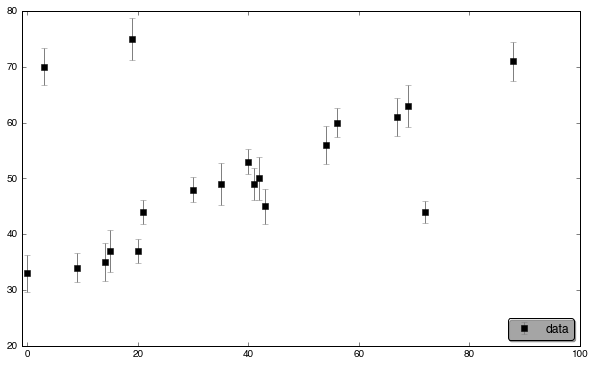

In [3]:
plt.figure(figsize=(10, 6))
plt.errorbar(x, y, e, fmt='sk', ecolor='gray', label='data')
plt.xlim(-1, 100)
plt.legend(shadow=True, fancybox=True, loc='lower right', numpoints=1)
plt.show()

**what model would you fit to the data?**

## Frequentist Approach to Fitting a Line

### Model

So, we think that our data can be described by a linear model *M* defined by a slope $\theta_1$ and an intercept $\theta_2$:

$$
M(x;\theta_1, \theta_2) = \theta_1 x + \theta_2
$$

### Uncertanties

In reality no model will perfectly fit the data or if it does then you should be very suspicious about the data. In general, our data should be distributed around the model. As long as there are no systematic residuals and each data point is within a "*reasonable*" distance from the model, this is ok.

**How do you define "reasonable"?**

It is very common to assume Normal (Gaussian) distribution $\mathcal{N}$ for uncertanties. In this case we can say that the observed datum $y_i$ comes from the model $M$ with uncertanty $\sigma$:

$$
y_i \sim \mathcal{N}(M, \sigma)
$$

### How do we find the values of the model parameters that fit the data "best"?

In order to fit a model to data, we need to measure in a quantitative way how well a model with given parameters fits the data.
We need a function, sometimes called the cost/loss function, that defines the metrics of the goodness of the fit.

If we specify the cost function and minimize it we find the best fit.

What cost function should we specify?

Two often used ones are

Euclidean Distance / L1 Norm:

$$
S_{L1} = \sum_i \left|y_i - M(x_i;\theta)\right|
$$

Least Squares / L2 Norm:

$$
S_{L2} = \sum_i [ y_i - M(x_i;\theta) ]^{2}
$$

In theory we could use any cost function we want. However, justifying a random cost function might be tricky...

Lets look at an example.

### Example: Fitting a Line

In [4]:
from scipy import optimize

This is the same data as above:

In [5]:
x = np.array([ 0,  3,  9, 14, 15, 19, 20, 21, 30, 35,
              40, 41, 42, 43, 54, 56, 67, 69, 72, 88])
y = np.array([33, 70, 34, 35, 37, 75, 37, 44, 48, 49,
              53, 49, 50, 45, 56, 60, 61, 63, 44, 71])
e = np.array([ 3.3, 3.3, 2.6, 3.4, 3.8, 3.8, 2.2, 2.1, 2.3, 3.8,
               2.2, 2.8, 3.9, 3.1, 3.4, 2.6, 3.4, 3.7, 2.0, 3.5])
xfit = np.linspace(-1, 100)

We can now do a straight line fit with NumPy very easily by calling `numpy.polyfit`:

In [6]:
theta = np.polyfit(x, y, 1, w=1./e)
print theta

[  0.20926869  41.04429294]


What do you think the cost function we minimised was?

To confirm we can define the L1 and L2 Norms:

In [7]:
def L1(theta, x=x, y=y, e=e):
    dy = y - theta[0] - theta[1]*x
    return np.sum(np.abs(dy / e))

In [8]:
def L2(theta, x=x, y=y, e=e):
    dy = y - theta[0] - theta[1]*x
    return np.sum((dy / e)**2)

and use an optimisation algorithm for example `scipy.optimise.fmin`:

In [9]:
thetaA = optimize.fmin(L1, [1, 1])
print thetaA

Optimization terminated successfully.
         Current function value: 42.568002
         Iterations: 63
         Function evaluations: 117
[ 32.99993063   0.42592809]


In [10]:
thetaS = optimize.fmin(L2, [1, 1])
print thetaS

Optimization terminated successfully.
         Current function value: 247.754140
         Iterations: 65
         Function evaluations: 119
[ 41.0443224   0.2092681]


Lets visualise all these "fits":

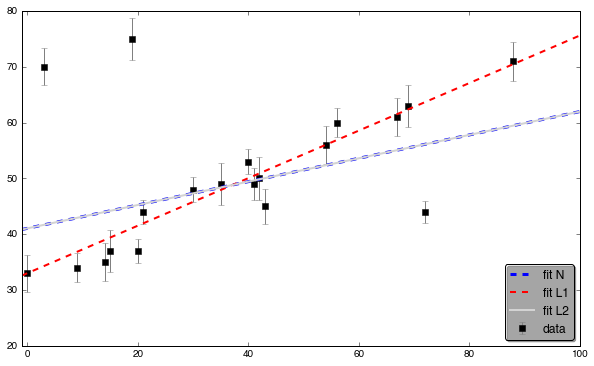

In [11]:
plt.figure(figsize=(10, 6))
plt.errorbar(x, y, e, fmt='sk', ecolor='gray', label='data')
plt.plot(xfit, theta[1] + theta[0] * xfit, 'b--', lw=3, label='fit N')
plt.plot(xfit, thetaA[0] + thetaA[1] * xfit, 'r--', lw=2, label='fit L1')
plt.plot(xfit, thetaS[0] + thetaS[1] * xfit, color='lightgray', lw=2, label='fit L2')
plt.legend(numpoints=1, shadow=True, fancybox=True, loc='best')
plt.xlim(-1, 100)
plt.show()

##### L1 looks a lot better than L2, why?

So, we found some lines that could be considered as "best" fits given our chosen cost function. We could also use something else, like Huber loss...

In [12]:
def huberLoss(t, c=2.5):
    """
    The Huber loss defines a critical value at which the loss curve
    transitions from quadratic to linear.
    """
    return ((abs(t) < c) * 0.5 * t ** 2
            + (abs(t) >= c) * -c * (0.5 * c - abs(t)))

In [13]:
def totalHuberLoss(theta, x=x, y=y, e=e, c=2.5):
    return huberLoss((y - theta[0] - theta[1] * x) / e, c).sum()

In [14]:
theta2 = optimize.fmin(totalHuberLoss, [0, 0], disp=False)
print theta2

[ 34.54906366   0.37447093]


However, how do we justify the selection of *c*?

I wouldn't know...

We can look at the results:

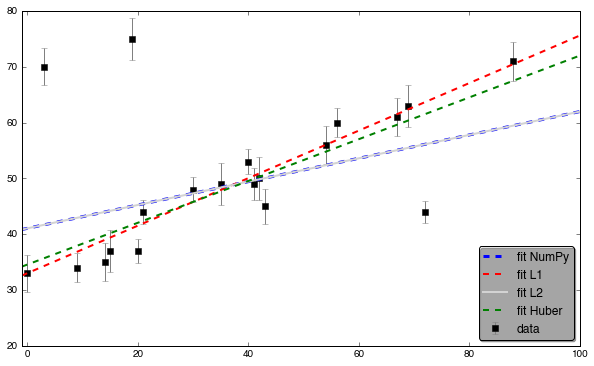

In [15]:
plt.figure(figsize=(10, 6))
plt.errorbar(x, y, e, fmt='sk', ecolor='gray', label='data')
plt.plot(xfit, theta[1] + theta[0] * xfit, 'b--', lw=3, label='fit NumPy')
plt.plot(xfit, thetaA[0] + thetaA[1] * xfit, 'r--', lw=2, label='fit L1')
plt.plot(xfit, thetaS[0] + thetaS[1] * xfit, color='lightgray', lw=2, label='fit L2')
plt.plot(xfit, theta2[0] + theta2[1] * xfit, 'g--', lw=2, label='fit Huber')
plt.legend(numpoints=1, shadow=True, fancybox=True, loc='best')
plt.xlim(-1, 100)
plt.show()

#### Great, we now got plenty of fits but which one should we choose for our paper?

## Likelihood

How can we justify a cost function?

We can think about this in a probabilistic way. For each $x_i$, we observe $y_i$. Lets consider now only a single datum $x_i$, any datum, for example $x_1$. For this datum the observed value $y_1$ is not necessarily the same as the "true" $y_{true}$, because our observations are limited (e.g. instrumental effects, noise, whatnot). We can therefore think that there is a probability distribution which describes how likely we are to observe a particular $y$ given the true $y_{true}$. While we cannot ever know the true value, it is still the one we are trying to recover (for example with our model).

We can now ask, what is the probability of observing $y_1$ given the true value $y_{true}$ $P(y_1 \, |\, y_{true})$. To answer this, we need to assume something about our measurement uncertainties (note that I avoid using the word "error", because errors should be corrected).

The most common choice is to use Normal distribution $\mathcal{N}$. In many cases this can be justified using e.g. Central limit theorem or maximum entropy arguments. However, if you are in the low number regime and counting e.g. photons, then you have to use Poisson distribution $\mathcal{P}$ or something more appropriate.

If we assume that our uncertanties follow Normal distribution, we can consider $y_1$ as a random variable, which is distributed like

$$
y_1 \sim \mathcal{N}(y_{true}, \sigma^2)
$$

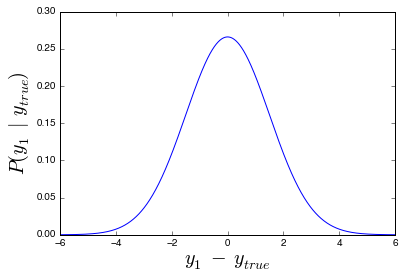

In [16]:
from scipy import stats
ydiff = np.linspace(-6, 6, 1000)
plt.plot(ydiff, stats.norm.pdf(ydiff, 0, 1.5))
plt.xlabel('$y_1\, - \, y_{true}$', size=20)
plt.ylabel('$P(y_1 \, |\, y_{true})$', size=20)
plt.show()

Given the assumed Normal distribution for a single value $y_1$, we can compute the probability $P$ of observing this point given the true $y_{true}$ and the uncertainty $\sigma$:

$$
P(y_1 \, | \, y_{true},\sigma) = \frac{1}{\sqrt{2\pi\sigma^2}}\exp\left[\frac{-(y_1 - y_{true})^2}{2\sigma^2}\right]
$$

### From a Single Point to Many

The above equation gives the probability of observing a single point given the true and the uncertainty, called the likelihood (probability of data given model). In practice, we are scientists after all, we have many data points, not only one, so the obvious question is how can we derive a likelihood for all the data points? This is the same as asking what is the joint probability of our points $y_i$ given the true values $y_{i, true}$ and associated uncertanties $\sigma_{i}$. Thus, the question is what is:

$$
P(y \, | \, y_{true}, \sigma) = \quad ?
$$

While this equation looks simple, it can be complicated to evaluate. However, if we **assume** that all $y_i$ are **independent** of each other we can write:

$$
P(y \, | \, y_{true}, \sigma) = \prod_{i=1}^N p(y_i~|~y_{i, true},\sigma_i)
$$

This is to say that if the idenpendence assumption holds we can simply multiply the individual probabilities together.

This product of probabilities is known as the **likelihood** $L$.

In practise, because these probabilities can become very small, we often take the logarithm of the above equation. In that case, the product turns into a sum, and we have the *log-likelihood*, which is often denoted as follows:

$$
\mathcal{L} = \log P(y \, | \, y_{true}, \sigma)  = \sum_{i=1}^N \log p(y_i~|~y_{i, true},\sigma_i)
$$

Given this formalism, we can now state that the model that maximises this likelihood is the model which best fits the data. Or in other words, the model which gives our observed data the highest probability is the most likely model.

### Maximising the Likelihood

So far we have found out that the model $M$ that maximises the likelihood $L$ can be considered the best fit.
So how can we maximise the likelihood?

If we assume that our uncertanties can be described by a Normal distribution $\mathcal{N}$, we get the following log-likelihood:

$$
\mathcal{L} = \log L = - \frac{N}{2}\log(2\pi) - N \sum_{i}^{N} \log(\sigma_{i}) -  \sum_{i}^{N} \frac{\left(D_{i} - M_{i}\right)^{2}}{2\sigma_{i}^{2}} \quad .
$$

If we are trying to maximise the above function we can omit the first term because this is a constant. The second term is also basically constant (albeit be careful with biased and unbiased estimators, this may not be true always). So, with these assumptions in mind, we are actually maximising:

$$
- \sum_{i}^{N} \frac{\left(D_{i} - M_{i}\right)^{2}}{2\sigma_{i}^{2}}
$$

This equation should look familiar. Anyone?

What we have found is that, in the presence of Normally distributed uncertanties that are independent, maximising the likelihood is identical to minimising the sum of squares (note the minus sign in front of the likelihood). This is the justification for the least-squares fitting.

But wait, we saw that the least-squares did not lead to a great fit. What gives?

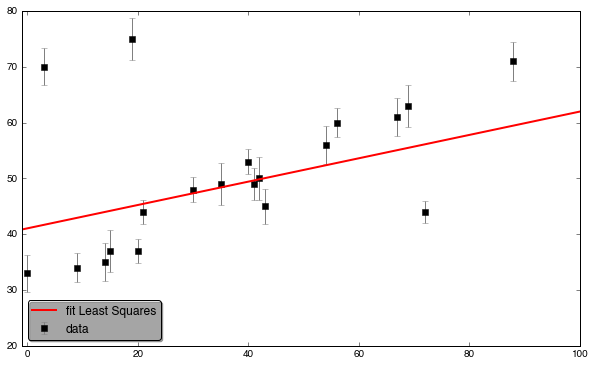

In [17]:
plt.figure(figsize=(10, 6))
plt.errorbar(x, y, e, fmt='sk', ecolor='gray', label='data')
plt.plot(xfit, thetaS[0] + thetaS[1] * xfit, 'r-', lw=2, label='fit Least Squares')
plt.legend(numpoints=1, shadow=True, fancybox=True, loc='best')
plt.xlim(-1, 100)
plt.show()

## Bayesian Approach to Fitting a Line

In data analysis we are often concerned with the question how good a description of the data a given model is. The aim is then to evaluate the posterior probability of the model $M$ given the observed data $D$ in presence of additional ``information'' $I$. The Bayesian paradigm dictates that inference about the model should be based on the probability of it given the data $P(M\, |\, D)$. If our model includes a set of parameters, denoted with $\bar{\theta}$, whose values we want to estimate from our data $D$, we can write Bayes' theorem as follows 

$$
P(M, \bar{\theta} \, |\, D, I) = \frac{P(D\, |\, M, \bar{\theta}, I)P(M, \bar{\theta}\, |\, I)}{P(D\, |\, I)} \quad .
$$

In this case we have included additional information $I$ to the analysis by including probability distributions for all model parameters $P(M, \bar{\theta} \, | \, I)$ as priors.

What are these terms?

#### *posterior*: $P(M, \bar{\theta}~|~D,I)$
This is the part we are interested in; the posterior probability of the model $M$ and its parameters $\bar{\theta}$ given data $D$ and information $I$.

#### *likelihood*: $P(D~|~M, \bar{\theta},I)$
This is the likelihood of the data $D$ given our model $M$, parameters $\bar{\theta}$, and information $I$ at hand.

#### *prior*: $P(M, \bar{\theta}~|~I)$
This probability function contains all information we have about the model $M$.

#### *evidence*: $P(D~|~I)$
This is a normalisation term, which is usually very difficult to calculate. On the bright side, we usually don't need this :-)

### Example: Fitting a Line via Sampling

So, to fit a line Bayesian style, we need a model $M$, likelihood $P(M \, | \, D, I)$, and priors $P(M \, | \, I)$. For practical reasons we write a log-likelihood.

In [18]:
def model(theta, x):
    return theta[0] * x + theta[1]

In [19]:
def log_pr(theta):
    return 0

In [20]:
def log_likelihood(theta, x, y, e):
    y_model = model(theta, x)
    return -0.5 * np.sum((y - y_model) ** 2 / (2 * e) ** 2)

In [21]:
def log_post(theta, x, y, e):
    return log_pr(theta) + log_likelihood(theta, x, y, e)

We then also need a way to draw samples from the posterior $P(M \, | \, D, I)$.

Once these samples are drawn, we can use the characteristics of our samples to solve our problem. In the following we use [emcee](http://dan.iel.fm/emcee/) package to do the sampling.

In [22]:
import emcee
from multiprocessing import Pool

print emcee.__version__

cores = 4 #run on 4 cores

2.1.0


In [23]:
ndim = 2        # number of parameters in the model
nwalkers = 50   # number of MCMC walkers
nburn = 500     # "burn-in" period to let chains stabilize
nsteps = 2000   # number of MCMC steps to take

In [24]:
starting_guesses = np.random.rand(nwalkers, ndim)

In [25]:
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_post, args=[x, y, e])
sampler.run_mcmc(starting_guesses, nsteps)

sample = sampler.chain  # shape = (nwalkers, nsteps, ndim)
sample = sampler.chain[:, nburn:, :].reshape(-1, 2)

So what are these samples and how can we visualise what we have done?

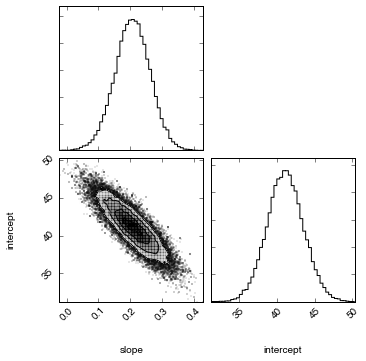

In [26]:
#!pip install triangle_plot
import triangle
triangle.corner(sample, labels=['slope', 'intercept']);

We see that the marginalised distributions for both the slope and intercept are more or less Normally distributed. There is however a correlation between the two parameters.

If we want to see the "best-fit" parameter values, we can choose the maximum of the posterior to find the *Maximum a Posteriori* fit. In case where the marginalised distributions are Gaussian these are close to the mean of the samples:

In [27]:
theta_MAP = sample.mean(0)
print(theta_MAP)

[  0.20670997  41.14321889]


Lets plot this fit:

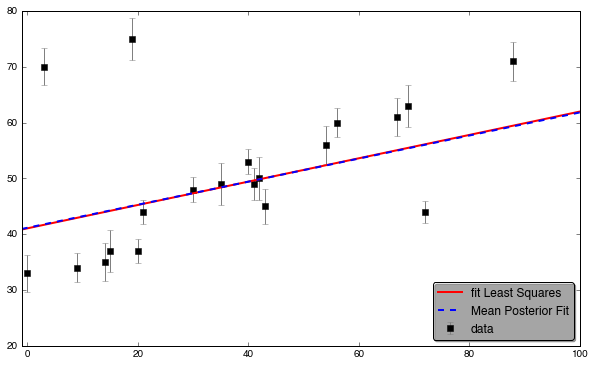

In [28]:
plt.figure(figsize=(10, 6))
plt.errorbar(x, y, e, fmt='sk', ecolor='gray', label='data')
plt.plot(xfit, thetaS[0] + thetaS[1] * xfit, 'r-', lw=2, label='fit Least Squares')
plt.plot(xfit, model(theta_MAP, xfit), 'b--', lw=2, label='Mean Posterior Fit')
plt.legend(numpoints=1, shadow=True, fancybox=True, loc='best')
plt.xlim(-1, 100)
plt.show()

What, we got the same result? Why waste my time?

Note though that in the Bayesian analysis, the result is not a single number. The Bayesian result is the full posterior, which our lines have sampled. Lets plot 300 of them.

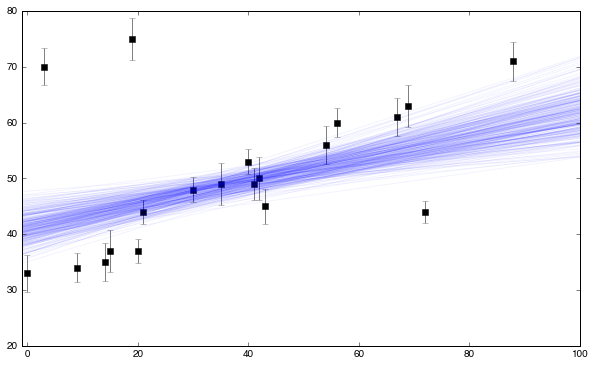

In [29]:
indices = np.random.choice(np.arange(len(sample)), 300)

plt.figure(figsize=(10, 6))
plt.errorbar(x, y, e, fmt='sk', ecolor='gray', label='data')
for i in indices:
    plt.plot(xfit, model(sample[i], xfit), '-b', alpha=0.05)
plt.xlim(-1, 100)
plt.show()

###### Still rubbish, what gives?

The problem is that our model is wrong. In the beginning of the session I said that we define a model that we **think** describes the data.

We assumed, incorrectly it seems, that all data were generated by a process that can be described by a line. What we should have realised is that there are at least three points that are highly suspicious. Perhaps we went on a coffee break and the measurements were rubbish.

What we need is a model that is flexible enough to deal with measurements that may be outliers. We could just fudge these data points out, sigma-clip, "forget", or what not. Or we could just bite the bullet and do the Right Thing.

### Example: Fitting a Line with Outliers

Lets adopt a more complicated model that has the flexibility to account for outliers. One option is to choose a mixture between the signal and a nuisance background.

We could assume that our data points come either from the real expirement or blunders. If we want to explicitly and objectively reject bad data points, we must add to the problem a set of N nuisance parameters $g_i$, one per data point. These nuisance parameters $g_i$ can be thought as weights which range from 0 to 1 and encode for each point $i$ the degree to which it fits the model, so that $g_i=0$ indicates an outlier, in which case a Gaussian of width $\sigma_B$ is used in the computation of the likelihood. This $\sigma_B$ can also be a nuisance parameter, or alternatively its value can be set to a sufficiently high value (e.g. 50). All these extra parameters may seem unnecessary, but their values can be inferred and marginalized out so in the end, we will be left with an inference just of the line parameters.

We can now write the likehood $P(D~|\, \bar{\theta},I)$ as a sum of the signal and the background:

$$
\begin{array}{ll}
P(x_i\, y_i, e_i~|~\bar{\theta},g_i,\sigma_B) = & \frac{g_i}{\sqrt{2\pi e_i^2}}\exp\left[\frac{-\left(\hat{y}(x_i~|~\bar{\theta}) - y_i\right)^2}{2e_i^2}\right] \\
&+ \frac{1 - g_i}{\sqrt{2\pi \sigma_B^2}}\exp\left[\frac{-\left(\hat{y}(x_i~|~\bar{\theta}) - y_i\right)^2}{2\sigma_B^2}\right]
\end{array}
$$



In [30]:
# theta will be an array of length 2 + N, where N is the number of points
# theta[0] is the intercept, theta[1] is the slope and theta[2 + i] is the weight g_i
def log_prior(theta):
    #g_i needs to be between 0 and 1
    if (all(theta[2:] > 0) and all(theta[2:] < 1)):
        return 0
    else:
        return -np.inf #log(0) = -inf

In [31]:
def log_likelihood(theta, x, y, e, sigma_B):
    dy = y - theta[0] - theta[1] * x
    g = np.clip(theta[2:], 0, 1)  # g<0 or g>1 leads to NaNs in logarithm
    logL1 = np.log(g) - 0.5 * np.log(2 * np.pi * e ** 2) - 0.5 * (dy / e) ** 2
    logL2 = np.log(1 - g) - 0.5 * np.log(2 * np.pi * sigma_B ** 2) - 0.5 * (dy / sigma_B) ** 2
    return np.sum(np.logaddexp(logL1, logL2))

In [32]:
def log_posterior(theta, x, y, e, sigma_B):
    lp = log_prior(theta)
    
    if not np.isfinite(lp):
        return -np.inf

    return lp + log_likelihood(theta, x, y, e, sigma_B)

In [33]:
ndim = 2 + len(x) 
nwalkers = 200   
nburn = 10000   
nsteps = 16000
print 'Number of free parameters in our model =', ndim
print 'Number of data points =', x.shape[0]

Number of free parameters in our model = 22
Number of data points = 20


Lets set up starting positions for the walkers:

In [34]:
np.random.seed(0)
starting_guesses = np.zeros((nwalkers, ndim))
starting_guesses[:, :2] = np.random.normal(thetaA, 0.1, size=(nwalkers, 2))
starting_guesses[:, 2:] = np.random.uniform(.4, 0.6, size=(nwalkers, ndim - 2))

and  the sampler:

In [35]:
pool = Pool(cores) #A hack Dan gave me to not have ghost processes running as with threads keyword
#sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior, args=[x, y, e, 50], pool=pool)
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior, args=[x, y, e, 50])

Finally we can run the MCMC...

In [36]:
pos, prob, state = sampler.run_mcmc(starting_guesses, nsteps)
print "Mean acceptance fraction:", np.mean(sampler.acceptance_fraction)

Mean acceptance fraction: 0.09451625


In [37]:
#Pull out samples from the chain
sample = sampler.chain[:, nburn:, :].reshape(-1, ndim)

Once we have samples, we can exploit a useful property of the Markov Chains. Because their distribution models the posterior, we can integrate out (i.e. marginalise) over nuisance parameters simply by ignoring them.

We can look at the (marginalized) distribution of slopes and intercepts by examining the first two columns of the sample:

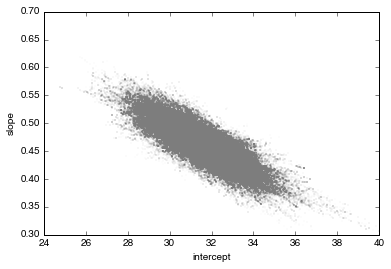

In [38]:
plt.plot(sample[:, 0], sample[:, 1], 'sk', alpha=0.1, markersize=0.1)
plt.xlabel('intercept')
plt.ylabel('slope')
plt.xlim(24, 40)
plt.ylim(0.3, 0.7)
plt.show()

We can also look at the one and two dimensional projections of the posterior probability distributions of model parameters. The Figure below shows the marginalized distribution for each parameter independently in the histograms along the diagonal and then the marginalized two dimensional distributions in the other panels. 

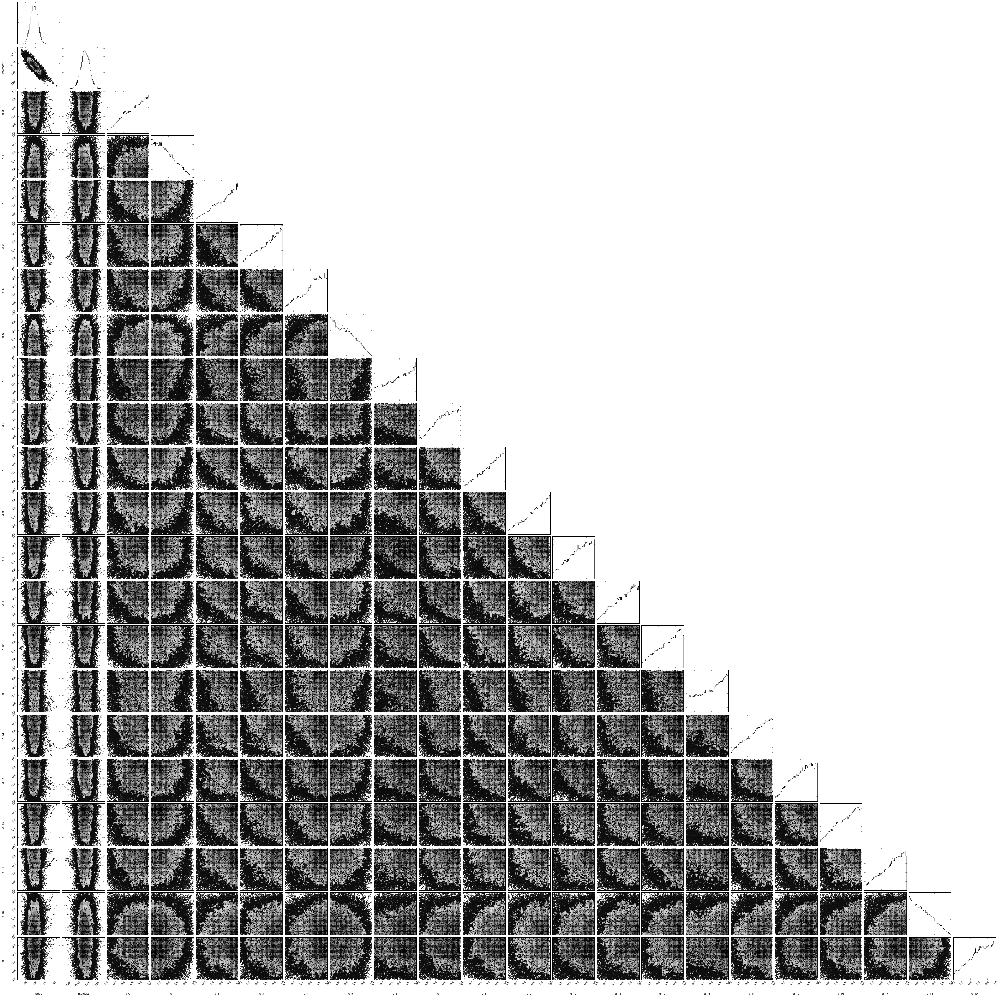

In [39]:
#note: this is pretty slow, you may wish to skip...
triangle.corner(sample, labels=['slope', 'intercept']+['g_%i' % tmp for tmp in range(len(x))]);

The next step is to find the mean of the samples and outliers with g < 0.5:

In [40]:
theta3 = np.mean(sample[:, :2], 0)
g = np.mean(sample[:, 2:], 0)
outliers = (g < 0.5)

Finally we have a robust fit, and we can make probabilistic statements about outliers!

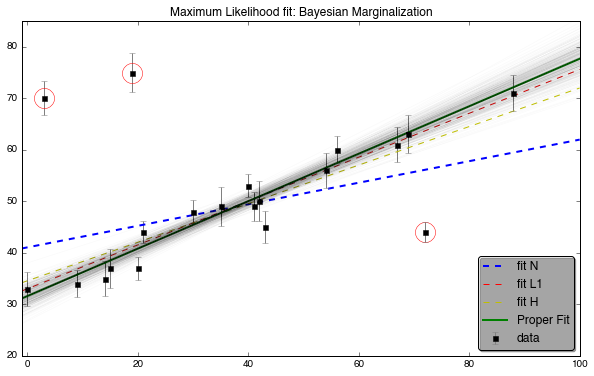

In [41]:
indices = np.random.choice(np.arange(len(sample)), 500)

plt.figure(figsize=(10, 6))

plt.plot(xfit, theta[1] + theta[0] * xfit, 'b--', lw=2, label='fit N')
plt.plot(xfit, thetaA[0] + thetaA[1] * xfit, 'r--', lw=1, label='fit L1')
plt.plot(xfit, theta2[0] + theta2[1] * xfit, 'y--', lw=1, label='fit H')
plt.plot(xfit, theta3[0] + theta3[1] * xfit, 'g-', lw=2, label='Proper Fit')
plt.plot(x[outliers], y[outliers], 'ro', ms=20, mfc='none', mec='red')

plt.errorbar(x, y, e, fmt='sk', ecolor='gray', label='data', ms=5)
for i in indices:
    plt.plot(xfit, sample[i, 0] + sample[i, 1]*xfit, '-k', alpha=0.02)

plt.title('Maximum Likelihood fit: Bayesian Marginalization')
plt.legend(numpoints=1, shadow=True, fancybox=True, loc='lower right')
plt.xlim(-1, 100)
plt.ylim(20, 85)
plt.show()

# Random Notes

### Priors

The choice of the probability functions for the priors is subjective. Even when we choose the most uninformative priors the posterior estimate is still dependent on this choice. Care must therefore be exercised when choosing the priors.

One can choose for example:

- A *Flat prior*, i.e. $p(\theta) \propto 1$ over a wide range.
- A *Noninformative prior*, based on e.g. dimensionality, symmetry, or entropy arguments.
- An *Empirical prior*, based on previous unrelated data which constrains the model.

### Marginalization

The posterior has some nice properties. For example, it is possible to integrate over some of the parameters in the posterior to find *marginalized* posteriors. This lets us ignore some parts of the fit, usually known as *nuisance parameters*.

### The Units of Probability Density

The units of a probability density are the inverse of the units of the quantity in question.